In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [47]:
data = pd.read_csv("Housing.csv")
data.size

206400

In [48]:
data = data.sample(n=20000, random_state=7)
sampled_indices = np.array(data.index)
sampled_indices

array([ 4648,  8740,   162, ..., 15865,  2251, 15069], dtype=int64)

In [49]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
4648,-118.31,34.06,31.00,2827.00,1084.00,3107.00,993.00,2.03,360000.00,<1H OCEAN
8740,-118.31,33.81,30.00,1773.00,356.00,905.00,352.00,4.31,336000.00,<1H OCEAN
162,-122.24,37.81,52.00,2513.00,502.00,1048.00,518.00,3.67,269900.00,NEAR BAY
15735,-122.43,37.78,26.00,3587.00,1034.00,1821.00,936.00,2.64,287500.00,NEAR BAY
18380,-121.86,37.21,23.00,2552.00,305.00,916.00,316.00,9.20,500001.00,<1H OCEAN
10643,-117.79,33.56,36.00,2057.00,329.00,658.00,309.00,7.87,500001.00,<1H OCEAN
10623,-117.77,33.67,12.00,4329.00,1068.00,1913.00,978.00,4.51,160200.00,<1H OCEAN
1612,-122.08,37.87,26.00,2405.00,564.00,680.00,531.00,2.49,73400.00,NEAR BAY
2634,-124.13,40.62,43.00,2131.00,399.00,910.00,389.00,2.58,92100.00,NEAR OCEAN
15995,-122.46,37.75,52.00,1590.00,236.00,622.00,232.00,5.82,500001.00,NEAR BAY


In [50]:
for column in data.columns:
    if data[column].dtype=='object':
        uniques = data[column].unique()
        print(f"Column {column} has {len(uniques)} number of unique values")
        print(uniques)
        print("\n")
    else:
        min_value = data[column].min()
        max_value = data[column].max()
        print(f"Column {column} has values in range {min_value} to {max_value}")
        print("\n")

Column longitude has values in range -124.35 to -114.31


Column latitude has values in range 32.54 to 41.95


Column housing_median_age has values in range 1.0 to 52.0


Column total_rooms has values in range 2.0 to 39320.0


Column total_bedrooms has values in range 1.0 to 6445.0


Column population has values in range 3.0 to 28566.0


Column households has values in range 1.0 to 6082.0


Column median_income has values in range 0.4999 to 15.0001


Column median_house_value has values in range 14999.0 to 500001.0


Column ocean_proximity has 5 number of unique values
['<1H OCEAN' 'NEAR BAY' 'NEAR OCEAN' 'INLAND' 'ISLAND']




In [51]:
for column in data.columns:
    print(column, data[column].isnull().sum())

longitude 0
latitude 0
housing_median_age 0
total_rooms 0
total_bedrooms 201
population 0
households 0
median_income 0
median_house_value 0
ocean_proximity 0


In [52]:
pd.set_option('display.float_format', '{:.2f}'.format)
data.cov()
#Cov(X, Y) = Σ[(x_i - μ_x) * (y_i - μ_y)] / (n - 1)
#2 random variables mdhla relation sathi use hoto, hyachi positive value mhanje 1 vadhla ki dusra pn vadhnar 

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,4.01,-3.95,-2.72,187.31,57.88,221.21,41.68,-0.07,-11086.60
latitude,-3.95,4.55,0.28,-159.85,-59.25,-257.55,-57.12,-0.31,-35190.02
housing_median_age,-2.72,0.28,158.33,-9903.16,-1700.56,-4206.77,-1458.43,-2.79,155928.50
total_rooms,187.31,-159.85,-9903.16,4704086.14,845035.16,2070180.78,755870.00,823.30,33606247.38
total_bedrooms,57.88,-59.25,-1700.56,845035.16,175016.19,409857.31,155621.42,-5.75,2365934.79
population,221.21,-257.55,-4206.77,2070180.78,409857.31,1224478.68,384090.39,11.43,-3281552.79
households,41.68,-57.12,-1458.43,755870.00,155621.42,384090.39,144195.45,9.77,2843104.35
median_income,-0.07,-0.31,-2.79,823.30,-5.75,11.43,9.77,3.60,150875.84
median_house_value,-11086.60,-35190.02,155928.50,33606247.38,2365934.79,-3281552.79,2843104.35,150875.84,13329287065.04


In [53]:
mean1 = data['total_bedrooms'].mean()
data['total_bedrooms'] = data['total_bedrooms'].fillna(mean1)

In [54]:
data.cov()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,4.01,-3.95,-2.72,187.31,57.30,221.21,41.68,-0.07,-11086.60
latitude,-3.95,4.55,0.28,-159.85,-58.66,-257.55,-57.12,-0.31,-35190.02
housing_median_age,-2.72,0.28,158.33,-9903.16,-1683.46,-4206.77,-1458.43,-2.79,155928.50
total_rooms,187.31,-159.85,-9903.16,4704086.14,836542.13,2070180.78,755870.00,823.30,33606247.38
total_bedrooms,57.30,-58.66,-1683.46,836542.13,173257.19,405738.04,154057.35,-5.70,2342155.96
population,221.21,-257.55,-4206.77,2070180.78,405738.04,1224478.68,384090.39,11.43,-3281552.79
households,41.68,-57.12,-1458.43,755870.00,154057.35,384090.39,144195.45,9.77,2843104.35
median_income,-0.07,-0.31,-2.79,823.30,-5.70,11.43,9.77,3.60,150875.84
median_house_value,-11086.60,-35190.02,155928.50,33606247.38,2342155.96,-3281552.79,2843104.35,150875.84,13329287065.04


In [55]:
for column in data.columns:
    print(column, data[column].isnull().sum())

longitude 0
latitude 0
housing_median_age 0
total_rooms 0
total_bedrooms 0
population 0
households 0
median_income 0
median_house_value 0
ocean_proximity 0


In [56]:
datafinal = pd.get_dummies(data, columns=['ocean_proximity'], prefix=['ocean_proximity'])
columns_to_drop = ['ocean_proximity_ISLAND']  
#to remove multicolinerity from columns
datafinal = datafinal.drop(columns_to_drop, axis=1)
#pn ith kami zalay drop kelyani actually silhoutte coefficient
datafinal.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
4648,-118.31,34.06,31.00,2827.00,1084.00,3107.00,993.00,2.03,360000.00,1,0,0,0
8740,-118.31,33.81,30.00,1773.00,356.00,905.00,352.00,4.31,336000.00,1,0,0,0
162,-122.24,37.81,52.00,2513.00,502.00,1048.00,518.00,3.67,269900.00,0,0,1,0
15735,-122.43,37.78,26.00,3587.00,1034.00,1821.00,936.00,2.64,287500.00,0,0,1,0
18380,-121.86,37.21,23.00,2552.00,305.00,916.00,316.00,9.20,500001.00,1,0,0,0


In [57]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
datafinal2 = scaler.fit_transform(datafinal)
np.set_printoptions(suppress=True, precision=2)
datafinal2

array([[ 0.63, -0.74,  0.19, ..., -0.68, -0.35, -0.38],
       [ 0.63, -0.85,  0.11, ..., -0.68, -0.35, -0.38],
       [-1.33,  1.02,  1.85, ..., -0.68,  2.83, -0.38],
       ...,
       [-1.41,  1.  ,  1.85, ..., -0.68,  2.83, -0.38],
       [-0.12,  0.55,  0.74, ...,  1.47, -0.35, -0.38],
       [ 1.3 , -1.34,  0.5 , ..., -0.68, -0.35, -0.38]])

In [58]:
import numpy as np

#It does this by taking the difference between data[i] and data[j], which is a vector subtraction, and
#then calculating the norm (length) of the resulting vector.
#In other words, it computes the straight-line distance between these two points in a multi-dimensional space.

def calculate_distance_matrix(data):
    num_rows = data.shape[0]
    distances = np.zeros((num_rows, num_rows))

    for i in range(num_rows):
        for j in range(num_rows):
            distances[i, j] = np.linalg.norm(data[i] - data[j])

    return distances

def dbscan(distance_matrix, epsilon, min_samples):
    num_samples = distance_matrix.shape[0]
    labels = np.full(num_samples, -1)  

    cluster_id = 0

    for i in range(num_samples):
        if labels[i] != -1:  
            continue

        neighbors = [j for j in range(num_samples) if distance_matrix[i, j] <= epsilon]

        if len(neighbors) < min_samples:
            labels[i] = -1  # Mark as noise.
        else:
            cluster_id += 1
            expand_cluster(distance_matrix, labels, i, neighbors, cluster_id, epsilon, min_samples)

    return labels

def expand_cluster(distance_matrix, labels, point_idx, neighbors, cluster_id, epsilon, min_samples):
    labels[point_idx] = cluster_id

    i = 0
    while i < len(neighbors):
        neighbor_idx = neighbors[i]
        if labels[neighbor_idx] == -1:  # Neighbor not assigned to any cluster.
            labels[neighbor_idx] = cluster_id
            new_neighbors = [j for j in range(len(distance_matrix)) if distance_matrix[neighbor_idx, j] <= epsilon]
            if len(new_neighbors) >= min_samples:
                neighbors += new_neighbors
        i += 1


In [59]:
epsilon = 0.5
min_samples = 5 
distance_matrix = calculate_distance_matrix(datafinal2)  

cluster_labels = dbscan(distance_matrix, epsilon, min_samples)


In [60]:
cluster_labels

array([-1,  1,  2, ...,  2, -1,  1])

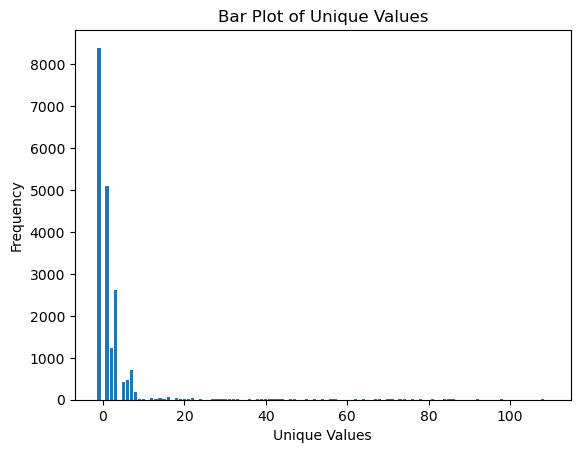

In [61]:
unique_values, counts = np.unique(cluster_labels, return_counts=True)
plt.bar(unique_values, counts)

plt.xlabel('Unique Values')
plt.ylabel('Frequency')
plt.title('Bar Plot of Unique Values')

plt.show()

In [62]:
epsilon = 1.5
min_samples = 7
distance_matrix = calculate_distance_matrix(datafinal2)  

cluster_labels = dbscan(distance_matrix, epsilon, min_samples)

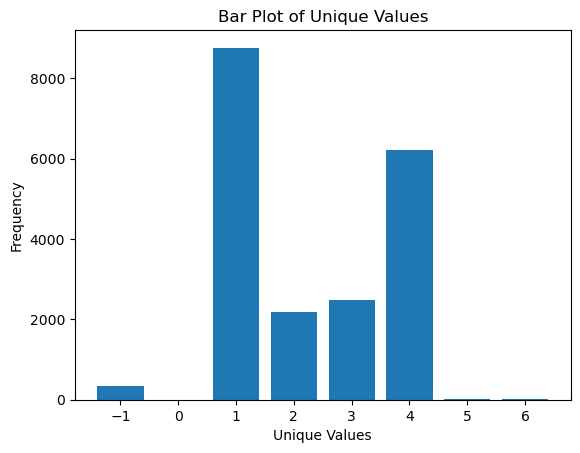

In [63]:
unique_values, counts = np.unique(cluster_labels, return_counts=True)
plt.bar(unique_values, counts)

plt.xlabel('Unique Values')
plt.ylabel('Frequency')
plt.title('Bar Plot of Unique Values')

plt.show()

In [64]:
epsilon = 2.5
min_samples = 3
distance_matrix = calculate_distance_matrix(datafinal2)  

cluster_labels = dbscan(distance_matrix, epsilon, min_samples)


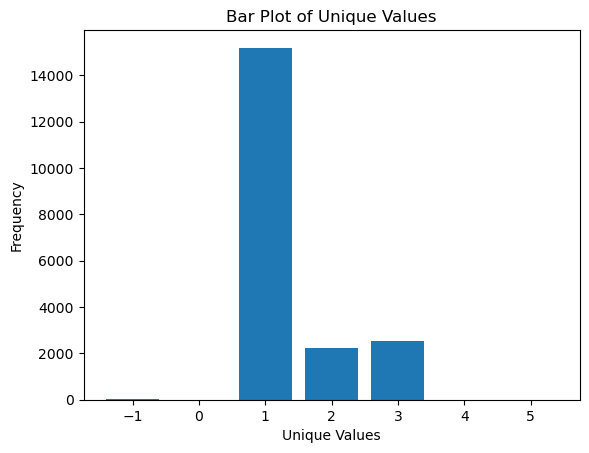

In [65]:
unique_values, counts = np.unique(cluster_labels, return_counts=True)
plt.bar(unique_values, counts)

plt.xlabel('Unique Values')
plt.ylabel('Frequency')
plt.title('Bar Plot of Unique Values')

plt.show()

In [66]:
from sklearn.metrics import pairwise_distances

def calculate_silhouette_score(data, cluster_labels):
    distance_matrix = pairwise_distances(data, data)

    silhouette_values = []

    for i, label in enumerate(cluster_labels):
        a = np.mean(distance_matrix[i][cluster_labels == label])

        b_values = []
        for j in np.unique(cluster_labels):
            if j != label:
                b_values.append(np.mean(distance_matrix[i][cluster_labels == j]))

        b = min(b_values) if b_values else 0

        silhouette = (b - a) / max(a, b)
        silhouette_values.append(silhouette)

    silhouette_avg = np.mean(silhouette_values)

    return silhouette_avg


print("Silhouette Score:", calculate_silhouette_score(datafinal2, cluster_labels))

Silhouette Score: 0.23933026311572508


In [67]:
import numpy as np
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(datafinal2, cluster_labels)

print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.23918287764626014


In [ ]:
cluster_sizes = [len(cluster) for cluster in clusters_list]

total_data_points = sum(cluster_sizes)

percentages = [(size / total_data_points) * 100 for size in cluster_sizes]

plt.figure(figsize=(6, 6))
plt.pie(percentages, labels=["Cluster " + str(i+1) for i in range(len(cluster_sizes))], autopct='%1.1f%%')

plt.title("Cluster Sizes")

plt.axis('equal')
plt.show()

# assumption that clusters are dense regions in space separated by regions of lower density 
#can be used when outlier detection techniques like z-score and iqr fails not unimodal and gaussian

In [ ]:
Near +1: swatachya group shi changla match itaranshi ny chnagli clustering

Near 0: decision boudary chya close swata ani dusrya cluster doghanshi same vagna failure case of dbscan 

Near -1: swata peksha dusrya cluster chi chnagla vagtoy kharab model

In [ ]:
If epsilon is too small: In such cases, we define the sparser clusters as noise i.e, result in the elimination of sparse clusters as outliers.

If epsilon is too large: In such cases, the denser clusters may be merged together, which gives the incorrect clusters.

In [ ]:
KMeans is much faster than DBScan.